# Project 5 $\cdot$ Julian Nowaczek

Setup environment:

In [81]:
import imageio
import numpy as np
import math
from matplotlib.colors import LogNorm
from matplotlib.mlab import bivariate_normal
import matplotlib.pyplot as plt
import scipy.misc as misc
import scipy.ndimage as ndi
from skimage import io, color, exposure, filters, img_as_float, img_as_ubyte

In [72]:
plt.style.use(['seaborn-poster', {'axes.grid': False, 'image.cmap' : 'Greys_r'}])

original = misc.face()
original_hsv = img_as_ubyte(color.rgb2hsv(original))

C:\ProgramData\Anaconda3\lib\site-packages\skimage\util\dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


## Question 1


Computing the average value for each of the RGB channels should produce a decent approximation of the color of the whole image, and it would be easy to increase the accuracy of the comparison by dividing the images into smaller sections.

In [4]:
misc.face().mean(axis=(0,1))

array([110.67604192, 117.72977066, 102.08241908])

## Question 2

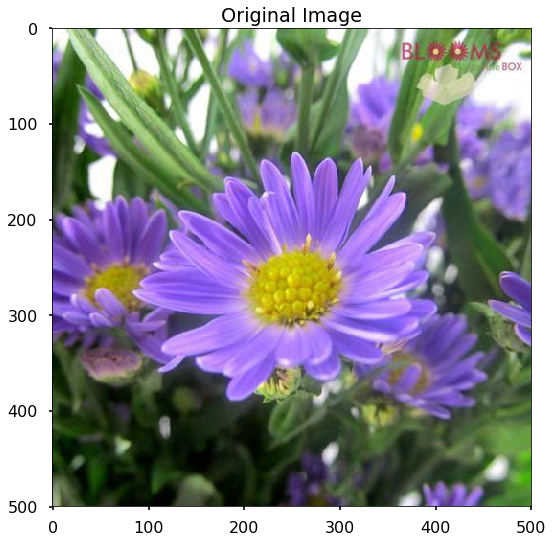

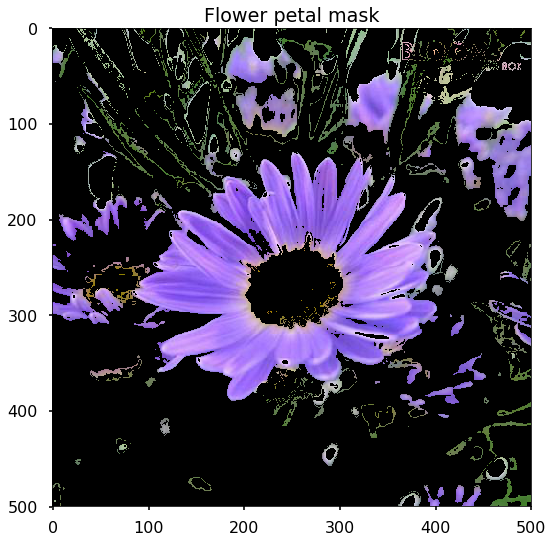

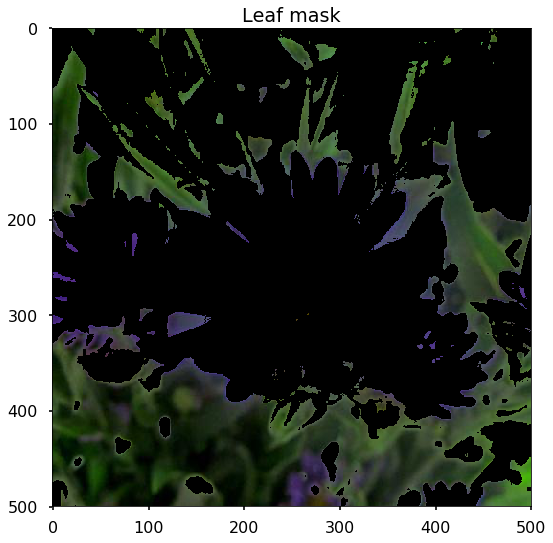

In [5]:
nature = imageio.imread('https://www.bloomsbythebox.com/img/product/xlarge/01377a__monte_casino_aster_purple.jpg')
plt.title('Original Image')
plt.imshow(nature)
plt.show()
flower_mask = np.ones(nature.shape[:2], dtype='uint8')
leaves_mask = np.ones(nature.shape[:2], dtype='uint8')
for index in np.ndindex(nature.shape[:2]):
    red, green, blue = nature[index][0], nature[index][1], nature[index][2] 
    if (blue < 200 and green < 120 or blue < 140 and green > 130 or green > 200):
        flower_mask[index] = 0
    if (red > 85 or blue > 140):
        leaves_mask[index] = 0
flower_mask = np.stack((flower_mask, flower_mask, flower_mask), axis=2)
leaves_mask = np.stack((leaves_mask, leaves_mask, leaves_mask), axis=2)
plt.title('Flower petal mask')
plt.imshow(np.multiply(flower_mask, nature))
plt.show()
plt.title('Leaf mask')
plt.imshow(np.multiply(leaves_mask, nature))
plt.show()

I found that it was impossible to guess-and-check my way to useable masks without looking at specific pixel values using the eyedropper tool in GIMP.

## Question 3

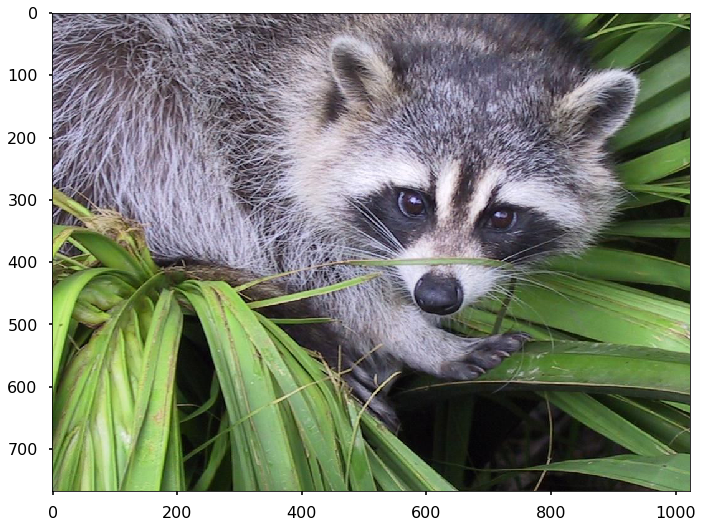

In [6]:
plt.imshow(original)
plt.show()

### A.

According to equation 6.2-1 in the textbook, the transformation from RGB color to CMY is the following equation assuming the RGB values are normalized to $[0,1]$

$$\begin{bmatrix}C \\ M \\ Y\end{bmatrix} = \begin{bmatrix}1 \\ 1 \\ 1\end{bmatrix} - \begin{bmatrix}R \\ G \\ B\end{bmatrix}$$

It doesn't look like SciKit-Image has a function for this (apparently display color gamut factors into the normalization so that probably has something to do with it), so I implement my own below

In [7]:
def rgb2cmy(image):
    normalized = np.zeros(image.shape, dtype='float')

    normalized[:,:,0] = image[:,:,0] / np.max(image[:,:,0])
    normalized[:,:,1] = image[:,:,1] / np.max(image[:,:,1])
    normalized[:,:,2] = image[:,:,2] / np.max(image[:,:,2])
    
    return np.ones(image.shape, dtype='float') - normalized

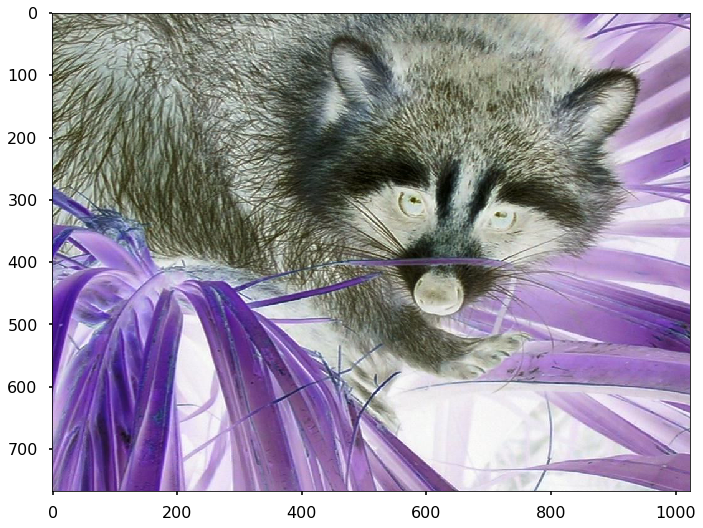

In [8]:
cmy_face = rgb2cmy(original)
plt.imshow(cmy_face)
plt.show()

I don't think a CMY colormap can exist, but at least it's inverted which is about what I expected.

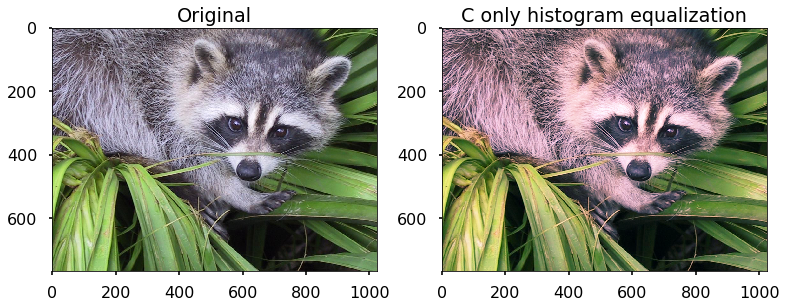

In [17]:
cyan = cmy_face[:,:,0]
equal_cyan = exposure.equalize_hist(cyan)
result = cmy_face.copy()
result[:,:,0] = equal_cyan
plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(original)
plt.subplot(1, 2, 2)
plt.title('C only histogram equalization')
plt.imshow(rgb2cmy(result))
plt.show()

### B.

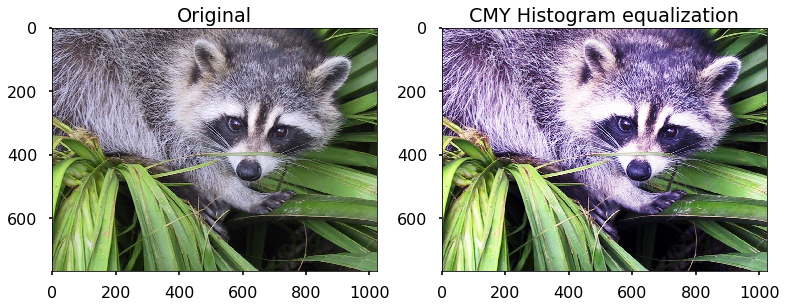

In [15]:
magenta, yellow = cmy_face[:,:,1], cmy_face[:,:,2]
equal_magenta = exposure.equalize_hist(magenta)
equal_yellow = exposure.equalize_hist(yellow)
result = np.stack((equal_cyan, equal_magenta, equal_yellow), axis=2)
plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(original)
plt.subplot(1, 2, 2)
plt.title('CMY Histogram equalization')
plt.imshow(rgb2cmy(result))
plt.show()

Honestly, I have no idea why this looks the way it does. The process does seem to ruin the white balance of the image, since the raccoon is now sort of blueish.

### C.

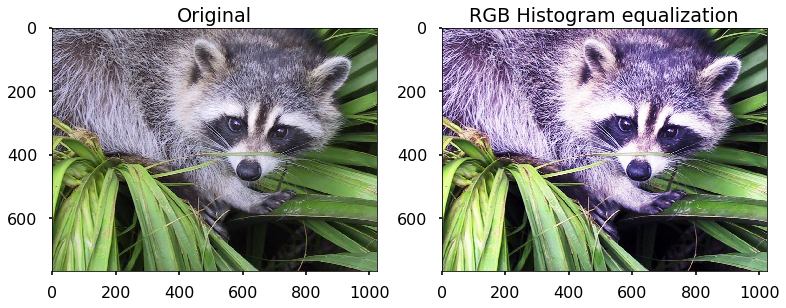

In [11]:
red, green, blue = original[:,:,0], original[:,:,1], original[:,:,2]
equal_red = exposure.equalize_hist(red)
equal_green = exposure.equalize_hist(green)
equal_blue = exposure.equalize_hist(blue)
result = np.stack((equal_red, equal_green, equal_blue), axis=2)
plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(original)
plt.subplot(1, 2, 2)
plt.title('RGB Histogram equalization')
plt.imshow(result)
plt.show()

This process in the RGB space produces an indistinguishable result compared to the same process in the CMY space. This makes sense since the two histograms would be the same shape, just mirrored across the X axis.

### D.

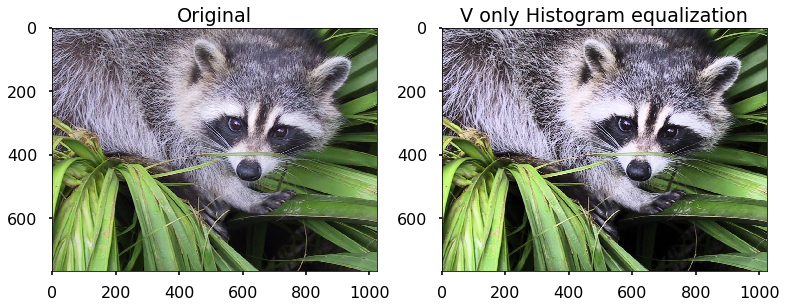

In [12]:
hsv_face = color.rgb2hsv(original)
value = hsv_face[:,:,2]
equal_value = exposure.equalize_hist(value)
result = hsv_face
result[:,:,2] = equal_value
result = color.hsv2rgb(result)
plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(original)
plt.subplot(1, 2, 2)
plt.title('V only Histogram equalization')
plt.imshow(result)
plt.show()

### E.

Color enhancement through histogram processing provides a way to correct for deficiencies in one or more color channels. With an RGB image this can correct for a tint, but the same method may be used on a HSV image to adjust overall brightness.

## Question 4

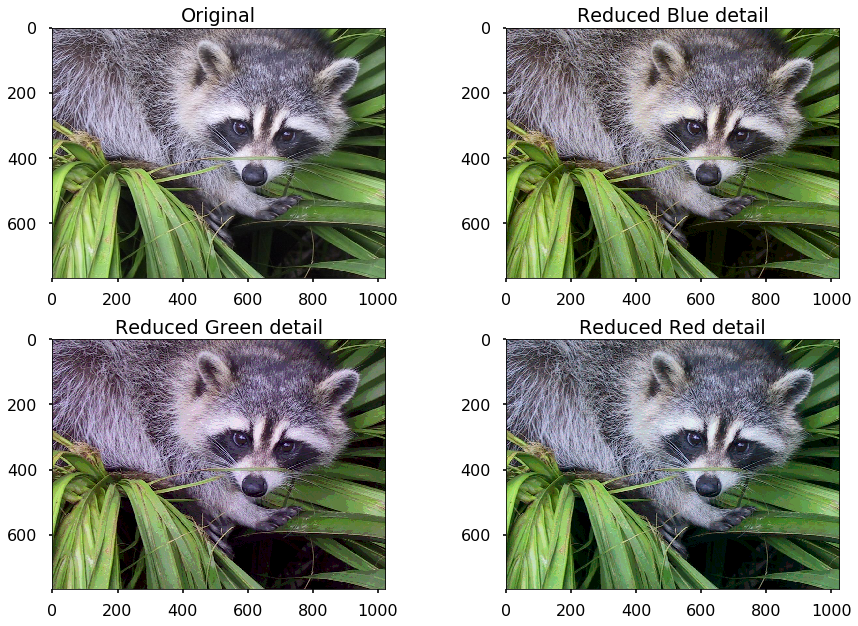

In [31]:
three_bit_red = (original[:,:,0] // 16) * 16
two_bit_red = (original[:,:,0] // 32) * 32
three_bit_green = (original[:,:,1] // 16) * 16
two_bit_green = (original[:,:,1] // 32) * 32
three_bit_blue = (original[:,:,2] // 16) * 16
two_bit_blue = (original[:,:,2] // 32) * 32
plt.subplot(2,2,1)
plt.title('Original')
plt.imshow(original)
plt.subplot(2,2,2)
plt.title('Reduced Blue detail')
plt.imshow(np.stack((three_bit_red, three_bit_green, two_bit_blue), axis=2))
plt.subplot(2,2,3)
plt.title('Reduced Green detail')
plt.imshow(np.stack((three_bit_red, two_bit_green, three_bit_blue), axis=2))
plt.subplot(2,2,4)
plt.title('Reduced Red detail')
plt.imshow(np.stack((two_bit_red, three_bit_green, three_bit_blue), axis=2))
plt.tight_layout()
plt.show()

## Question 5

C:\ProgramData\Anaconda3\lib\site-packages\skimage\util\dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


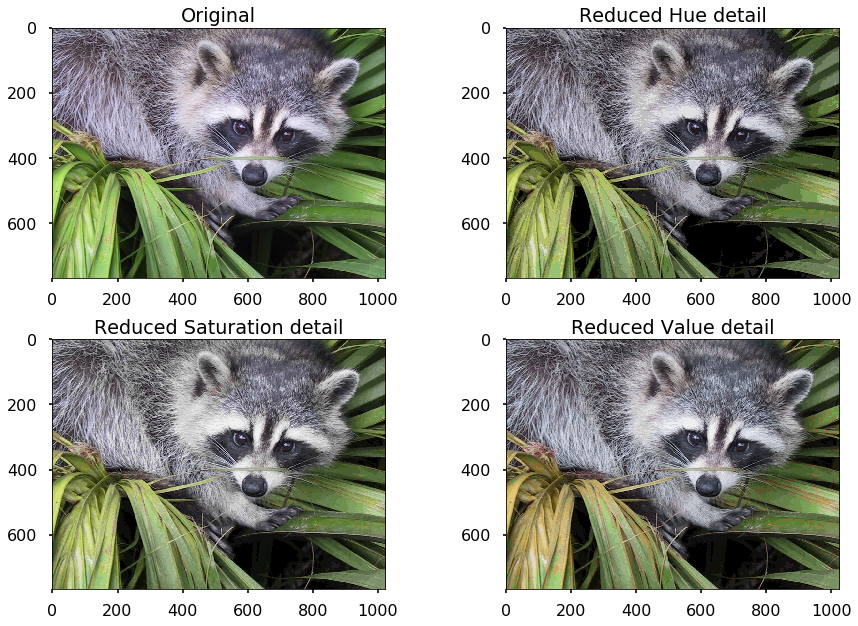

In [73]:
three_bit_hue = (original_hsv[:,:,0] // 16) * 16
two_bit_hue = (original_hsv[:,:,0] // 32) * 32
three_bit_sat = (original_hsv[:,:,1] // 16) * 16
two_bit_sat = (original_hsv[:,:,1] // 32) * 32
three_bit_value = (original_hsv[:,:,2] // 16) * 16
two_bit_value = (original_hsv[:,:,2] // 32) * 32
plt.subplot(2,2,1)
plt.title('Original')
plt.imshow(original)
plt.subplot(2,2,2)
plt.title('Reduced Hue detail')
plt.imshow(img_as_ubyte(color.hsv2rgb(np.stack((three_bit_hue, three_bit_sat, two_bit_value), axis=2))))
plt.subplot(2,2,3)
plt.title('Reduced Saturation detail')
plt.imshow(img_as_ubyte(color.hsv2rgb(np.stack((three_bit_hue, two_bit_sat, three_bit_value), axis=2))))
plt.subplot(2,2,4)
plt.title('Reduced Value detail')
plt.imshow(img_as_ubyte(color.hsv2rgb(np.stack((two_bit_hue, three_bit_sat, three_bit_value), axis=2))))
plt.tight_layout()
plt.show()

## Question 6

### A.

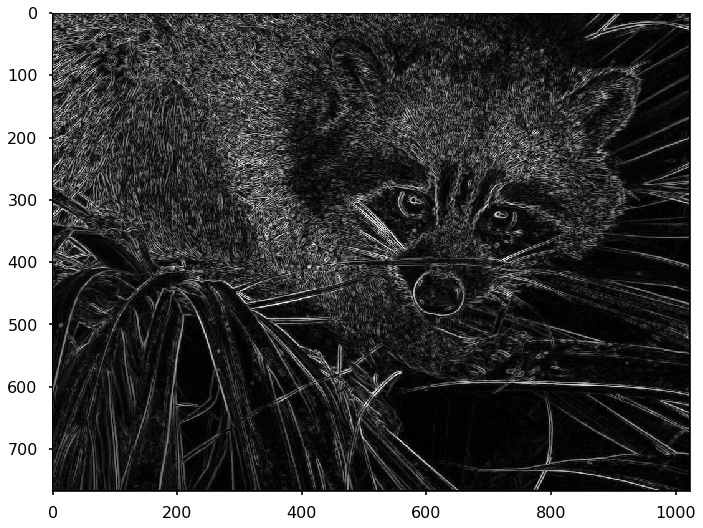

In [66]:
r_edge = filters.sobel(original[:,:,0])
g_edge = filters.sobel(original[:,:,1])
b_edge = filters.sobel(original[:,:,2])
edge = r_edge + g_edge + b_edge
plt.imshow(edge)
plt.show()

### B.

### C.

## Question 7

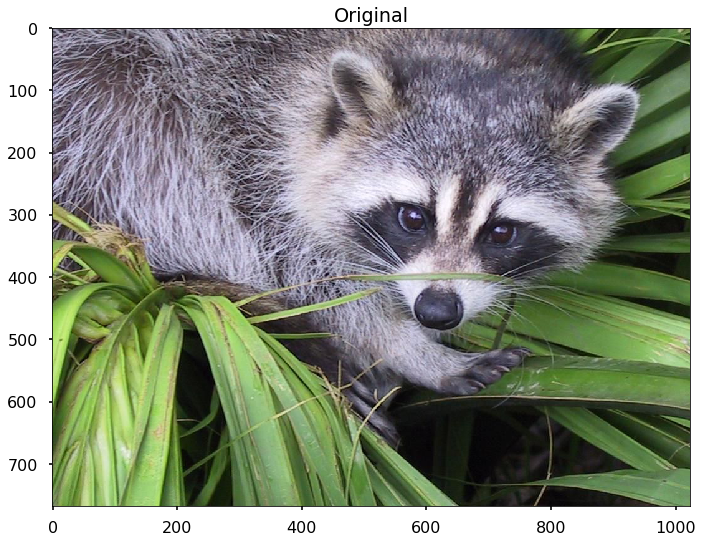

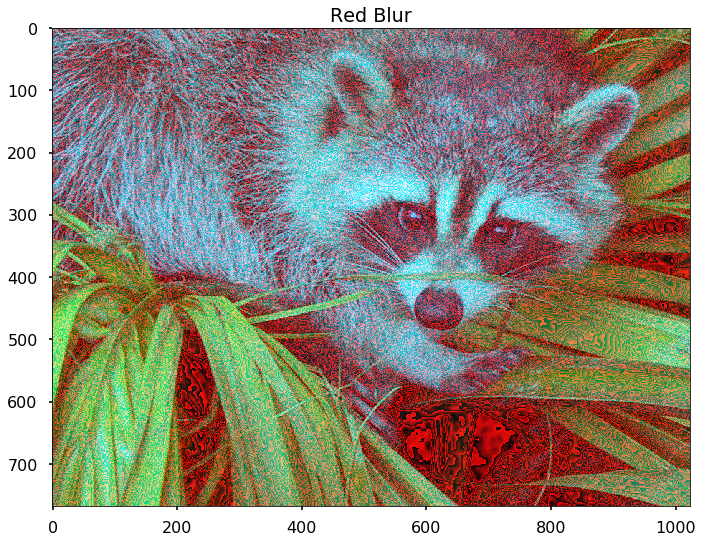

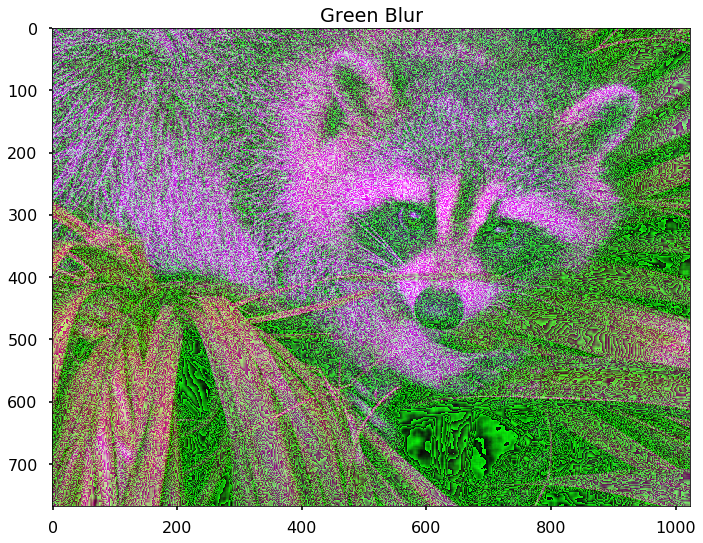

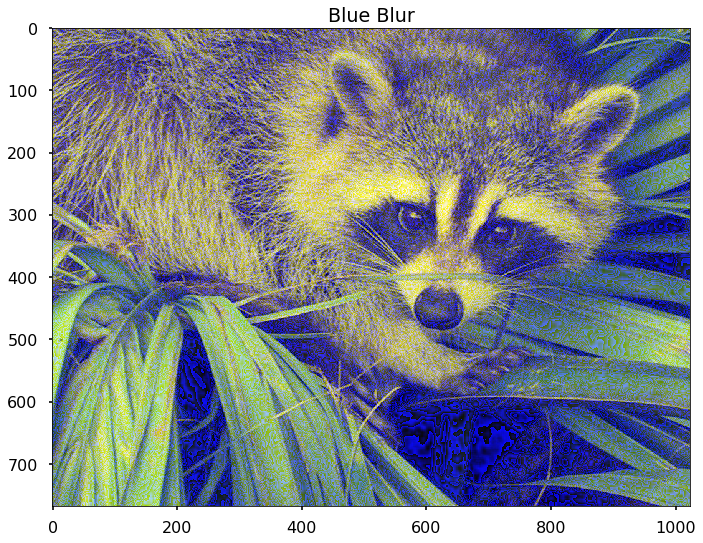

In [13]:
average = np.ones((9,9))
red, green, blue = original[:,:,0], original[:,:,1], original[:,:,2]
av_red, av_green, av_blue = ndi.filters.convolve(red, average), ndi.filters.convolve(green, average), ndi.filters.convolve(blue, average)
plt.title('Original')
plt.imshow(original)
plt.show()
plt.title('Red Blur')
plt.imshow(np.stack((av_red, green, blue), axis=2))
plt.show()
plt.title('Green Blur')
plt.imshow(np.stack((red, av_green, blue), axis=2))
plt.show()
plt.title('Blue Blur')
plt.imshow(np.stack((red, green, av_blue), axis=2))
plt.show()

I think this experiment demonstrates how our eyes are more sensitive to green, red, then blue since the change in the green channel is most dramatic, followed by red. The averaging of the blue channel does not disrupt the image nearly as much.

## Question 8

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


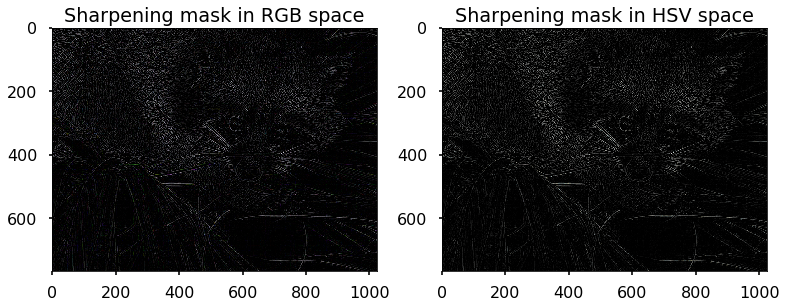

In [103]:
laplacian = [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]]
rgb = img_as_float(original)
hsv = img_as_float(color.rgb2hsv(original))
r_sharp = ndi.filters.convolve(rgb[:,:,0], laplacian)
r_sharp = r_sharp / np.max(np.abs(r_sharp))
g_sharp = ndi.filters.convolve(rgb[:,:,1], laplacian)
g_sharp = g_sharp / np.max(np.abs(g_sharp))
b_sharp = ndi.filters.convolve(rgb[:,:,2], laplacian)
b_sharp = b_sharp / np.max(np.abs(b_sharp))
h_sharp = ndi.filters.convolve(hsv[:,:,0], laplacian)
h_sharp = h_sharp / np.max(np.abs(h_sharp))
s_sharp = ndi.filters.convolve(hsv[:,:,1], laplacian)
s_sharp = s_sharp / np.max(np.abs(s_sharp))
v_sharp = ndi.filters.convolve(hsv[:,:,2], laplacian)
v_sharp = v_sharp / np.max(np.abs(v_sharp))

plt.subplot(1, 2, 1)
plt.title('Sharpening mask in RGB space')
plt.imshow(np.stack((r_sharp, g_sharp, b_sharp), axis=2))
plt.subplot(1, 2, 2)
plt.title('Sharpening mask in HSV space')
plt.imshow(color.hsv2rgb(np.stack((h_sharp, s_sharp, v_sharp), axis=2)))
plt.show()

## Question 9